# Quadratic Forms and Definiteness


(11.1) **Quadratic forms.** 
Let $\mathbf Q \in \mathbb R^{n\times n}$ be a symmetric matrix. The associated **quadratic form** is defined as $f_\mathbf Q(\mathbf x) = \mathbf x^\top\mathbf Q \mathbf x$ for $\mathbf x \in \mathbb R^n$ to real numbers $\mathbf x^\top \mathbf Q \mathbf x.$ The quadratic form can be interpreted as the corresponding energy function of the matrix. Below we will classify quadratic forms based on its energy profile. And we will see that this profile is intimately connected with the spectrum of the matrix. 

<br>

**Remark.** If a square matrix $\mathbf A$ is not symmetric, then we can always symmetrize it in the quadratic form: $\mathbf x^\top \mathbf A \mathbf x =  \mathbf x^\top\frac{1}{2}\left(\mathbf A^\top + \mathbf A\right)\mathbf x.$ Thus, we can limit the discussion of quadratic forms to symmetric matrices without loss of generality.

<br> 


(11.2) **Classifying quadratic forms.** A matrix $\mathbf Q$ is classified according to the possible signs that its quadratic form can take:

  * **Positive definite** if $f_\mathbf Q(\mathbf x) > 0$ for nonzero $\mathbf x.$

  * **Positive semidefinite** if $f_\mathbf Q(\mathbf x) \geq 0$ for all $\mathbf x.$

  * **Indefinite** if $f_\mathbf Q(\mathbf x)$ can be negative and positive. 


<br>

<p align='center'>
    <img src='../img/quadratic_forms.png'>
    <br>
    <b>Figure.</b> Classification of quadratic forms.
</p>

<br>

(11.3) **Principal axes theorem and maximal directions.** 
This is simply an extension of the real spectral theorem. Recall that any real symmetric matrix $\mathbf Q$ has a spectral decomposition $\mathbf Q = \mathbf U \mathbf \Lambda \mathbf U^\top$ such that $\mathbf \Lambda$ is a real matrix of eigenvalues and $\mathbf U = [\mathbf u_1, \ldots, \mathbf u_n]$ is an orthogonal matrix composed of the corresponding orthogonal eigenvectors. This allows us to 'diagonalize' the quadratic form:

$$f_\mathbf Q (\mathbf x) = (\mathbf U^\top \mathbf x)^\top \mathbf \Lambda\; (\mathbf U^\top \mathbf x).$$

This makes it clear how the quadratic form acts on an input vector. First, it projects the vector $\mathbf x$ onto the principal axes getting $x_i = \mathbf u_i^\top \mathbf x.$ The resulting vector is dotted to itself weighted by the eigenvalues resulting in $\sum_{i=1}^n \lambda_i {x_i}^2.$ Observe that the principal axes are orthogonal directions of fixed rates of increase or decrease of energy. Assuming $\lambda_1 \geq \ldots \geq \lambda_n,$ then the maximal increase in energy is along $\pm\mathbf u_1$ where $f_\mathbf Q(\pm\mathbf u_1) = \lambda_1.$ On the other hand, the maximal decrease in energy is along $\pm\mathbf u_n$ where $f_\mathbf Q(\pm\mathbf u_n) = \lambda_n.$ For any other direction, we get a suboptimal weighting of eigenvalues.

<br>

(11.4) **Code demo: principal axes of quadratic forms.** In the following code cell, we verify the theory by plotting the principal axes of each symmetrized matrix in the above figure (except the upper right). The results are shown below. We weigh the eigenvectors with the corresponding eigenvalues which indicates the rate of energy increase along that direction (or decrease if the eigenvalue is negative).

<br>

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d 
np.random.seed(0)


def QF(x, Q):
    '''Quadratic form of a matrix Q.'''
    return (x.T @ Q @ x) / (x.T @ x)


def plot_QF_surface(Q):
    # symmetrize
    Q = 0.5*(Q.T + Q)
    
    fig = plt.figure(figsize=(6, 3))
    ax1 = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122)

    N = 400 # size of grid
    row = np.linspace(-5, 5, N)
    XX, YY = np.meshgrid(row, row)
    ZZ = np.zeros_like(XX)
    for i in range(N):
        for j in range(N):
            ZZ[i, j] = QF(np.array([XX[i, j], YY[i, j]]), Q)

    # plot 3D surface 
    ax1.plot_surface(XX, YY, ZZ, cmap='Reds') 
    ax1.set_xlabel(f'$w_0$')
    ax1.set_ylabel(f'$w_1$')

    # plot contour and principal axes
    ax2.contourf(XX, YY, ZZ, cmap='Reds', levels=30)
    ax2.set_xlabel(f'$w_0$')
    ax2.set_ylabel(f'$w_1$')

    # compute eigenvectors
    eigvals, eigvecs = np.linalg.eig(Q)
    idx = np.argsort(-eigvals) # sort decreasing
    eigvecs = eigvecs[:, idx]
    eigvals = eigvals[idx]

    # plot
    eigvec0 = ax2.arrow(0, 0, eigvals[0]*eigvecs[0, 0], eigvals[0]*eigvecs[1, 0], color='green', label=f'$\lambda_0 u_0$')
    eigvec1 = ax2.arrow(0, 0, eigvals[1]*eigvecs[0, 1], eigvals[1]*eigvecs[1, 1], color='blue',  label=f'$\lambda_1 u_1$')
    ax2.legend([eigvec0, eigvec1], [f'$\lambda_0 u_0$', f'$\lambda_1 u_1$'])
    ax2.set_title(f'$\lambda_0$={eigvals[0]:.2f}, $\lambda_1$={eigvals[1]:.2f}', fontsize=10)


    fig.tight_layout()
    plt.show() # can move 3d plot around

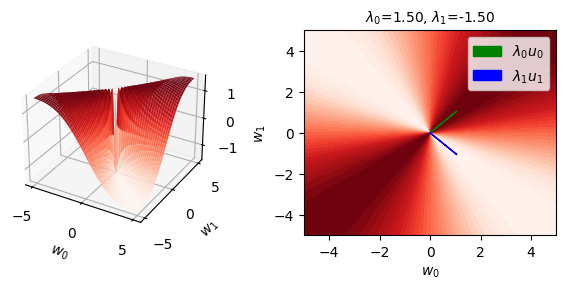

In [2]:
Q = np.array([
    [0, 1],
    [2, 0]
])
plot_QF_surface(Q)

<b>Figure.</b> Quadratic form of a definite matrix; unique minimum. <br>


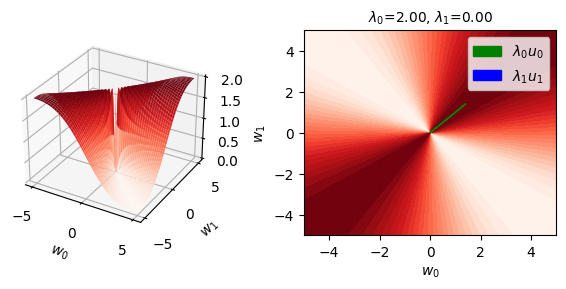

In [3]:
Q = np.array([
    [1, 1],
    [1, 1]
])
plot_QF_surface(Q)

<b>Figure.</b> Quadratic form of a definite matrix; nonunique minimum (1-dim). <br>


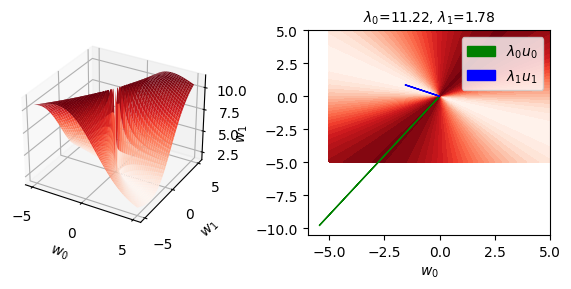

In [4]:
Q = np.array([
    [4, 4],
    [4, 9]
])
plot_QF_surface(Q)

<b>Figure.</b> Quadratic form of an indefinite matrix; has a stationary point but no minimum. <br>


<br>

(11.5) **Definiteness and eigenvalues.** 
Suppose $\mathbf Q$ has positive eigenvalues, then $f_\mathbf Q(\mathbf x) = \sum_{i=1}^n \lambda_i y_i^2 > 0.$ Similarly, $f_\mathbf Q(\mathbf x) = \sum_{i=1}^n \lambda_i y_i^2 \geq 0$ whenever $\mathbf Q$ has nonnegative eigenvalues. Conversely, we can use eigenvector inputs to pick out individual eigenvalues so that positive definiteness implies positive eigenvalues. Similarly, positive semidefiniteness implies having nonnegative eigenvalues. 

Now suppose $\mathbf Q$ has eigenvalues of mixed signs. Then, we can pick out these directions to show that $\mathbf Q$ is indefinite. To prove the converse, suppose $\mathbf Q$ is indefinite. Let $f_{\mathbf Q}(\boldsymbol p) > 0$ and let $p_i = \mathbf u_i^\top \boldsymbol p.$ Then, $\sum_{i=1}^n \lambda_i {p_i}^2 > 0.$ It follows that some $\lambda_i > 0.$ Similarly, assuming $f_{\mathbf Q}(\boldsymbol q) < 0$ for some $\boldsymbol q$ implies a negative eigenvalue exists. Thus, $\mathbf Q$ has eigenvalues of mixed signs. 

In summary:

* All eigenvalues positive iff. $\mathbf Q$ is positive definite.
* All eigenvalues nonnegative iff. $\mathbf Q$ is positive semidefinite.
* Positive and negative eigenvalues iff. $\mathbf Q$ is indefinite.

<br>


(11.6) **Invertibility.** As a consequence of the characterization of the eigenvalues of $\mathbf Q,$ a positive definite matrix is invertible since it has a trivial null space, whereas a positive semidefinite is noninvertible since it has a nontrivial nullspace which is the eigenspace of zero. 

<br>

<p align="center">
<img src='../img/quadratic_form_invertibility.png' width=80%>
<br>
<b>Figure.</b> Summary of the results of this section.
</p>

<br>

<br>

(11.7) **Normalized QF.** One other way of analyzing the energy function is by 'normalizing' it, i.e. computing 
$$\tilde f_\mathbf Q(\mathbf x) = \frac{\mathbf x^\top \mathbf Q \mathbf x}{\mathbf x^\top\mathbf x} = \sum_{i,j=1}^n q_{ij} \frac{x_i x_j}{\sum_{i=1}^n {x_i}^2}.$$

Since we are only dividing the the norm squared of $\mathbf x,$ the two principal axes $\pm\mathbf u_1$ and $\pm\mathbf u_n$ should still be the same directions of greatest increase and decrease. Indeed, this is verified by the ff. plots generated in `18_normalized_QF.py`. Observe that, unlike before, the plots are now bounded, i.e. by $\lambda_1 = \sup \tilde f_\mathbf Q$ and $\lambda_n = \inf \tilde f_\mathbf Q.$ It has, however, a singularity at the origin. Having 'fixed rate' of energy increase along the principal axes, it is now more straightforward to see that the energy function actually fixed along these directions: $\tilde f_\mathbf Q(a\mathbf u_i) = \lambda_i$ for any scalar $a.$ 

<br>

In [5]:
np.random.seed(0)

def QF(x, Q):
    '''Quadratic form of a matrix Q.'''
    return x.T @ Q @ x

def plot_QF_surface(Q):
    # symmetrize
    Q = 0.5*(Q.T + Q)
    
    fig = plt.figure(figsize=(6, 3))
    ax1 = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122)

    N = 400 # size of grid
    row = np.linspace(-5, 5, N)
    XX, YY = np.meshgrid(row, row)
    ZZ = np.zeros_like(XX)
    for i in range(N):
        for j in range(N):
            ZZ[i, j] = QF(np.array([XX[i, j], YY[i, j]]), Q)

    # plot 3D surface 
    ax1.plot_surface(XX, YY, ZZ, cmap='Reds') 
    ax1.set_xlabel(f'$w_0$')
    ax1.set_ylabel(f'$w_1$')

    # plot contour and principal axes
    ax2.contourf(XX, YY, ZZ, cmap='Reds', levels=30)
    ax2.set_xlabel(f'$w_0$')
    ax2.set_ylabel(f'$w_1$')

    # compute eigenvectors
    eigvals, eigvecs = np.linalg.eig(Q)
    idx = np.argsort(-eigvals) # sort decreasing
    eigvecs = eigvecs[:, idx]
    eigvals = eigvals[idx]

    # plot
    eigvec0 = ax2.arrow(0, 0, eigvals[0]*eigvecs[0, 0], eigvals[0]*eigvecs[1, 0], color='green', label=f'$\lambda_0 u_0$')
    eigvec1 = ax2.arrow(0, 0, eigvals[1]*eigvecs[0, 1], eigvals[1]*eigvecs[1, 1], color='blue',  label=f'$\lambda_1 u_1$')
    ax2.legend([eigvec0, eigvec1], [f'$\lambda_0 u_0$', f'$\lambda_1 u_1$'])
    ax2.set_title(f'$\lambda_0$={eigvals[0]:.2f}, $\lambda_1$={eigvals[1]:.2f}', fontsize=10)


    fig.tight_layout()
    plt.show() # can move 3d plot around

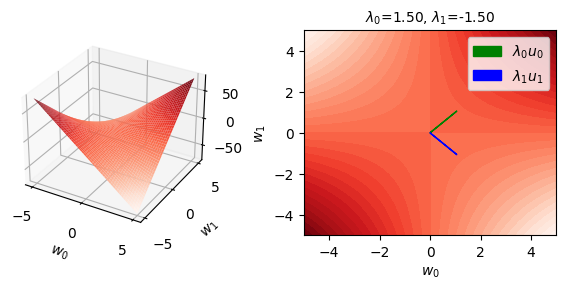

In [6]:
Q = np.array([
    [0, 1],
    [2, 0]
])
plot_QF_surface(Q)

<b>Figure.</b> Energy surface of a definite matrix.

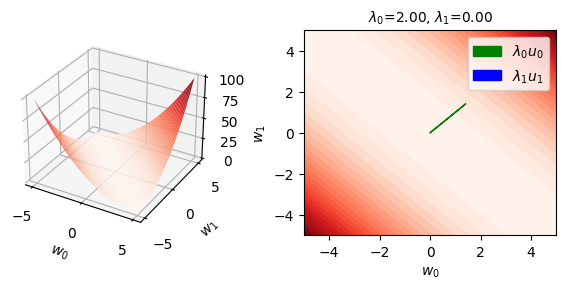

In [7]:
Q = np.array([
    [1, 1],
    [1, 1]
])
plot_QF_surface(Q)

<b>Figure.</b> Energy surface of a semidefinite matrix. <br>

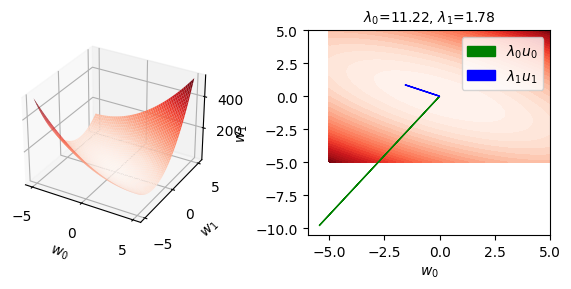

In [8]:
Q = np.array([
    [4, 4],
    [4, 9]
])
plot_QF_surface(Q)

<b>Figure.</b> Energy surface of an indefinite matrix.  <br>